### 2021 Spring
### [ME 5013] Big data analysis in extreme environments < Final Project >
# Statistical Analysis of Sea Ice Extent in the Arctic Ocean using AMSR Passive Microwave Data

- Python code for data processing and statistical analysis
- Last updated by YoungHyun Koo (younghyun.koo@utsa.edu) on 05/11/2021

## Import necessary packages

In [2]:
import pandas as pd
import glob, os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import h5py
import datetime as dt
import gc
from mpl_toolkits.basemap import Basemap

# Ignore warning
import warnings
warnings.filterwarnings("ignore")

## Visualize sea ice concentration data

In [81]:
# Functions to read 25-km resolution AMSR data (Sea ice concentration) from .h5 raw file
def get_AMSR(fileT):

    f1 = h5py.File(fileT, 'r')
    # Latitude & longitude
    lat = f1['HDFEOS/GRIDS/NpPolarGrid25km/lat'][:]
    lon = f1['HDFEOS/GRIDS/NpPolarGrid25km/lon'][:]
    # Sea ice concentration (sic)
    sic = f1['HDFEOS/GRIDS/NpPolarGrid25km/Data Fields/SI_25km_NH_ICECON_DAY'][:]
    
    del f1
    
    return sic, lat, lon

# Calculate Sea ice extent (SIE) from Sea ice concentration (SIC)
# Sea ice extent: area showing SIC > 15 %
def calculate_sie(sic, th = 15):
    # threshold = 15 % of SIC
    sie = len(sic[(sic >= th) & (sic <= 100)]) * (25*25) # unit: sq km (grid size: 25 km X 25 km)
    return sie

# Define 11 subregions from lat and lon
def define_regions(lat, lon, mask):
    # subregion: 2D numpy array (same size with lat, lon) showing each region
    subregion = np.zeros(np.shape(lat)) * np.nan
    
    region = {} # region: index of each region in lat, lon arrays
    region['AO'] = np.where((lat>=82) & (mask == 0)) # Central Arctic
    region['BS'] = np.where((lat>=70) & (lat<82) & (lon<-120) & (lon>=-150) & (mask == 0)) # Beaufort Sea
    region['CS'] = np.where((lat>=67) & (lat<82) & (lon<-150) & (lon>=-180) & (mask == 0)) # Chukchi Sea
    region['ESS'] = np.where((lat>=70) & (lat<82) & (lon<180) & (lon>=140) & (mask == 0)) # East-Sibrian Sea
    region['LS'] = np.where((lat>=70) & (lat<82) & (lon<140) & (lon>=100) & (mask == 0)) # Laptev Sea
    region['KS'] = np.where((lat>=70) & (lat<82) & (lon<100) & (lon>=55) & (mask == 0)) # Kara Sea
    region['BNS'] = np.where((lat>=67) & (lat<82) & (lon<55) & (lon>=0) & (mask == 0)) # Barents-Norwegian Sea
    region['GS'] = np.where((lat>=67) & (lat<82) & (lon<0) & (lon>=-40) & (mask == 0)) # Greenland sea
    region['CA'] = np.where((lat>=67) & (lat<82) & (lon<-70) & (lon>=-120) & (mask == 0)) # Canadian Archipelago
    region['HB'] = np.where((lat>=52) & (lat<67) & (lon<-70) & (lon>=-95) & (mask == 0)) # Hudson Bay
    region['BB'] = np.where((lat>=52) & (lat<82) & (lon<-40) & (lon>=-70) & (mask == 0)) # Baffin Bay
    
    i = 0
    for k in region.keys():
        subregion[region[k]] = i # assign numbers to the pixels of each sub-region
        i += 1
    
    return subregion, region

## Read AMSR sea ice concentration data

In [52]:
## MAIN =========================================================
## Read all AMSR data
## Output
## - sic_con: 3D numpy array with SIC (row * col * number of days)
## - lat: latitude of each grid point
## - lon: longitude of each grid point

import time
files = sorted(glob.glob("F:\\2021_SIE\\AMSR_25km\\*.he5"))
s0 = time.time()

sic0, lat, lon = get_AMSR(files[0])
mask = np.zeros(np.shape(lat)) # land-sea mask
mask[sic0 == 120] = 1 # land = 1; sea = 0;

subregion, rg_idx = define_regions(lat, lon, mask) # read subregion

first = True
for i in range(0, len(files)):
    
    fileT = files[i]
    t0 = dt.datetime.strptime(fileT[-12:-4], "%Y%m%d")
    
    sic0, lat, lon = get_AMSR(fileT)
    missing = len(sic0[sic0==110])
    # sic = 110: missing data (mostly near north pole)
    # sic = 120: land masking
    # valid sic value: 0-100
    
    # Working with float (includes NaN values)
    # sic = np.zeros(np.shape(lat)) * np.nan
    # sic[sic0 <= 100] = sic0[sic0 <= 100]

    # Working with integer (110 or 120 becomes 0)
    sic = np.copy(sic0)
    sic[sic > 100] = 0
    
    sie = calculate_sie(sic) # calculate SIE from SIC
    df0 = pd.DataFrame({'date': t0, 'year': t0.year, 'month': t0.month, 'SIE': [sie]}) # dataframe of SIE
    df1 = pd.DataFrame({'date': t0, 'year': t0.year, 'month': t0.month, 'SIC': [np.mean(sic[sic>0])]}) # dataframe of SIC
    
    for k in rg_idx.keys(): # calculate SIE & averaged SIC for each subregion
        part = sic[rg_idx[k]]
        df0[k] = calculate_sie(part)
        df1[k] = np.mean(part[part>0])
    
    # Number of missing grids >= 300: assume invalid data -> excluded
    if first and missing < 300:
        sic_con = np.copy(sic)
        df_sie = df0 # pandas dataframe for SIE
        df_sic = df1 # pandas dataframe for averaged SIC
        first = False
    elif missing < 300:
        sic_con = np.dstack((sic_con, sic))
        df_sie = df_sie.append(df0).reset_index(drop = True)
        df_sic = df_sic.append(df1).reset_index(drop = True)
    else:
        print(t0, missing)
        
    del sic0, df0

    if (t0.day == 1) and (t0.month % 2 == 0):
        s1 = time.time()
        print("{0} ... {1}/{2} ({3} sec)".format(t0, i, len(files), round(s1-s0, 2)))

print("=== FINISH reading datasets ===")

if len(df_sie) > 3000:
    # Save the resulting numpy array and dataframe
    df_sie.to_csv("result\\SIE_NH.csv") # save SIE 
    df_sic.to_csv("result\\SIC_NH.csv")
    np.save("sic_con", sic_con) # Save numpy array of SIC (.npy)
    np.save("lat", lat) # Save numpy array of latitude (.npy)
    np.save("lon", lon) # Save numpy array of longitude (.npy)
    np.save("mask", mask) # Save numpy array of land-sea mask (.npy)

sic_mean = np.mean(sic_con, axis = 2)
# z_mean, z_var, z_skew, z_kurt = get_statistics(sic_mean, r = 2)
print("=== FINISH getting statistical moments ===")

2012-08-01 00:00:00 ... 0/3186 (3.7 sec)
2012-10-01 00:00:00 ... 61/3186 (11.85 sec)
2012-12-01 00:00:00 ... 122/3186 (19.16 sec)
2013-02-01 00:00:00 ... 184/3186 (27.35 sec)
2013-04-01 00:00:00 ... 243/3186 (36.03 sec)
2013-05-14 00:00:00 28048
2013-06-01 00:00:00 ... 301/3186 (45.41 sec)
2013-08-01 00:00:00 ... 362/3186 (56.35 sec)
2013-10-01 00:00:00 ... 423/3186 (68.14 sec)
2013-12-01 00:00:00 ... 484/3186 (81.08 sec)
2014-02-01 00:00:00 ... 546/3186 (95.12 sec)
2014-04-01 00:00:00 ... 605/3186 (109.57 sec)
2014-06-01 00:00:00 ... 666/3186 (125.51 sec)
2014-08-01 00:00:00 ... 727/3186 (142.59 sec)
2014-10-01 00:00:00 ... 788/3186 (160.13 sec)
2014-12-01 00:00:00 ... 849/3186 (177.92 sec)
2015-02-01 00:00:00 ... 911/3186 (196.95 sec)
2015-04-01 00:00:00 ... 970/3186 (216.25 sec)
2015-06-01 00:00:00 ... 1031/3186 (237.23 sec)
2015-08-01 00:00:00 ... 1092/3186 (259.18 sec)
2015-10-01 00:00:00 ... 1153/3186 (282.05 sec)
2015-12-01 00:00:00 ... 1214/3186 (305.67 sec)
2015-12-03 00:00:00

## Draw maps

In [14]:
# Draw maps of Arctic SIC -----------------------------------------
def draw_map(lat, lon, sic, t0_str):
    fig = plt.figure(figsize = (10, 8))
    
    # Projection: North polar equal area, minimum latitude to display: 52N
    m = Basemap(projection='nplaea',boundinglat=52,lon_0=0,resolution='l')
    m.drawcoastlines() # include coastlines
    m.fillcontinents(color='lightgray',lake_color='white') # fill continent
    
    # draw parallels and meridians.
    m.drawparallels(np.arange(-80.,81.,20.))
    m.drawmeridians(np.arange(-180.,181.,20.))
    
    cmap = cm.get_cmap('Blues_r') # fill color
    m.drawmapboundary(fill_color=cmap(0))
    # draw tissot's indicatrix to show distortion.

    xgrid, ygrid = m(lon, lat)
    sc = plt.scatter(xgrid, ygrid, c = sic, cmap='Blues_r', marker = "s", vmin=0, vmax=100)
    # Draw scatterplot of SIC in the north polar projection
    
    # colorbar
    clb = fig.colorbar(sc, shrink=0.80, pad = 0.02)
    clb.set_label('Sea ice conc. (%)', rotation = 270, fontsize = 15, va = 'bottom')
    clb.ax.tick_params(labelsize=15)
    plt.title("SIC ({0})".format(t0_str), fontsize = 20)
    plt.savefig('result\\map\\sic_{0}.png'.format(t0_str), bbox_inches = "tight")
    
    plt.close()

In [3]:
## Read saved "sic_con.npy" array 
with open('sic_con.npy', 'rb') as f:
    sic_con = np.load(f)
print("sic_con: ", np.shape(sic_con))

## Read saved "lat.npy" array 
with open('lat.npy', 'rb') as f:
    lat = np.load(f)
print("lat: ", np.shape(lat))

## Read saved "lon.npy" array
with open('lon.npy', 'rb') as f:
    lon = np.load(f)
print("lon: ", np.shape(lon))

sic_con:  (448, 304, 3175)
lat:  (448, 304)
lon:  (448, 304)


In [15]:
## SIC map by year

df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

for y in range(2013, 2021): #df_sie['year'].unique()[:]:
    idx = (df_sie['year'] == y)
    sic_mean = np.mean(sic_con[:, :, idx], axis = 2)
    t0_str = str(y)
    draw_map(lat, lon, sic_mean, t0_str)
    print(t0_str)

2013
2014
2015
2016
2017
2018
2019
2020


In [763]:
## SIC map by month
df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

for y in range(2013, 2021): #df_sie['year'].unique()[:]:
    for m in sorted(df_sie['month'].unique()[:]):
        idx = (df_sie['year'] == y) & (df_sie['month'] == m)
        sic_mean = np.mean(sic_con[:, :, idx], axis = 2)
        t0_str = str(y) + str(m).zfill(2)
        draw_map(lat, lon, sic_mean, t0_str)
        print(t0_str)

201308
201309
201310
201311
201312
201301
201302
201303
201304
201305
201306
201307
201408
201409
201410
201411
201412
201401
201402
201403
201404
201405
201406
201407
201508
201509
201510
201511
201512
201501
201502
201503
201504
201505
201506
201507
201608
201609
201610
201611
201612
201601
201602
201603
201604
201605
201606
201607
201708
201709
201710
201711
201712
201701
201702
201703
201704
201705
201706
201707
201808
201809
201810
201811
201812
201801
201802
201803
201804
201805
201806
201807
201908
201909
201910
201911
201912
201901
201902
201903
201904
201905
201906
201907
202008
202009
202010
202011
202012
202001
202002
202003
202004
202005
202006
202007


In [16]:
import gc
gc.collect()
# Clear memory

134935

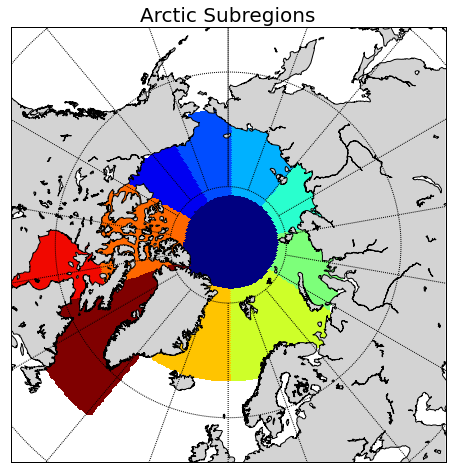

In [82]:
# draw sub-regions
def draw_region(lat, lon, subregion):
    fig = plt.figure(figsize = (10, 8))
    m = Basemap(projection='nplaea',boundinglat=52,lon_0=0,resolution='l')
    m.drawcoastlines()
    m.fillcontinents(color='lightgray',lake_color='white')
    # draw parallels and meridians.
    m.drawparallels(np.arange(-80.,81.,20.))
    m.drawmeridians(np.arange(-180.,181.,20.))
    m.drawmapboundary(fill_color='white')
    # draw tissot's indicatrix to show distortion.

    xgrid, ygrid = m(lon, lat)
    plt.scatter(xgrid, ygrid, c = subregion, cmap='jet', marker = "s", vmin=0, vmax=10)
    
    plt.title("Arctic Subregions", fontsize = 20)
    plt.savefig('result\\map\\arctic_subregion.png', bbox_inches = "tight")

subregion, rg_idx = define_regions(lat, lon, mask) # read subregion
draw_region(lat, lon, subregion)

In [20]:
# Show the SIE dataframe
df_sie.head(10)

,date,year,month,SIE,AO,BS,CS,ESS,LS,KS,BNS,GS,CA,HB,BB
0,2012-08-01,2012,8,3784375,2188125,317500,257500,383750,150625,7500,54375,95625,303125,21875,0
1,2012-08-02,2012,8,3817500,2180625,332500,230625,438125,155625,14375,41875,120625,285000,16875,1250
2,2012-08-03,2012,8,3608750,2193125,261250,205625,338125,162500,19375,35000,113125,262500,16250,0
3,2012-08-04,2012,8,3522500,2157500,224375,294375,263125,165625,18125,45000,88125,243125,18750,1875
4,2012-08-05,2012,8,3431875,2135000,330000,114375,271250,164375,16875,46875,116875,220000,14375,1875
5,2012-08-06,2012,8,3430625,2164375,210000,185000,273750,163125,10625,46250,136250,221250,18750,1250
6,2012-08-07,2012,8,3426875,2166250,305000,168125,225625,160000,5625,56250,136250,193125,9375,1250
7,2012-08-08,2012,8,3420625,2187500,285625,166875,229375,172500,6250,57500,94375,206875,6875,625
8,2012-08-09,2012,8,3300625,2153125,263125,148125,223750,166875,7500,38125,59375,230000,9375,1250
9,2012-08-10,2012,8,3218125,2121875,257500,161875,188750,135000,8125,37500,48125,250625,1875,1250


In [91]:
len(np.unique(subregion[subregion>=0]))

11

## 1. Temporal analysis

In [4]:
# Prepare data for the temporal analysis (only 2013-2020 data)
df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)
df_sie['date'] = pd.to_datetime(df_sie['date'])
df_sie = df_sie.loc[(df_sie['date'] < dt.datetime(2021, 1, 1)) &
                    (df_sie['date'] >= dt.datetime(2013, 1, 1)), :].reset_index(drop = True)

df_sie

,date,year,month,SIE,AO,BS,CS,ESS,LS,KS,BNS,GS,CA,HB,BB
0,2013-01-01,2013,1,12562500,2225000,988750,1202500,1225000,797500,855000,204375,464375,1131875,1122500,787500
1,2013-01-02,2013,1,12700625,2224375,988750,1200625,1225000,797500,865000,188125,468750,1133750,1122500,775625
2,2013-01-03,2013,1,12673125,2225625,988750,1205625,1224375,797500,855625,181875,470625,1131250,1123125,805000
3,2013-01-04,2013,1,12748125,2225625,988750,1201250,1224375,797500,830000,183750,480625,1132500,1122500,806250
4,2013-01-05,2013,1,12751875,2228125,988750,1198125,1224375,797500,820000,217500,473125,1131250,1123750,854375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2903,2020-12-27,2020,12,12213750,2258125,988750,1206250,1224375,797500,891250,287500,472500,1133125,1121875,668750
2904,2020-12-28,2020,12,12190625,2260000,988750,1206250,1225000,797500,895625,308750,472500,1131250,1120000,666875
2905,2020-12-29,2020,12,12331250,2261875,988750,1206250,1224375,797500,903125,311875,480000,1131250,1120625,688750
2906,2020-12-30,2020,12,12365000,2254375,988750,1205625,1225000,797500,908125,284375,490625,1131875,1121250,719375


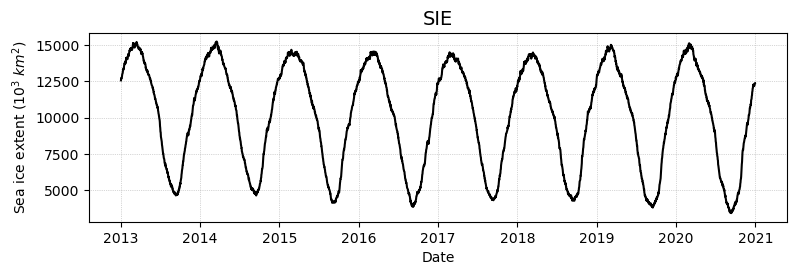

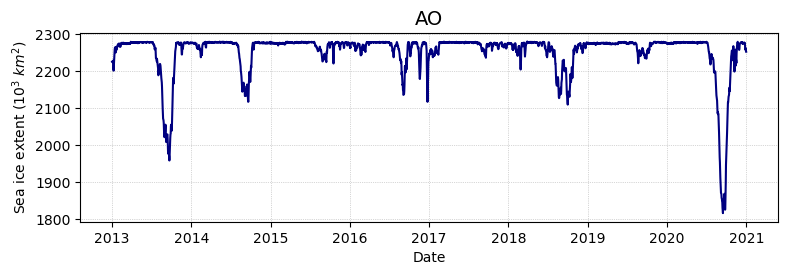

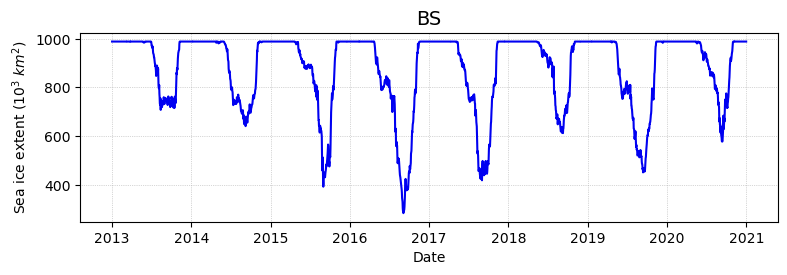

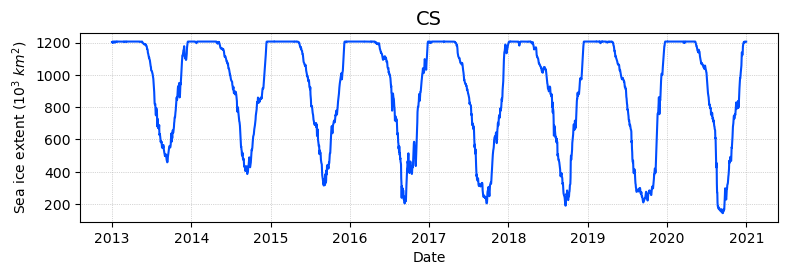

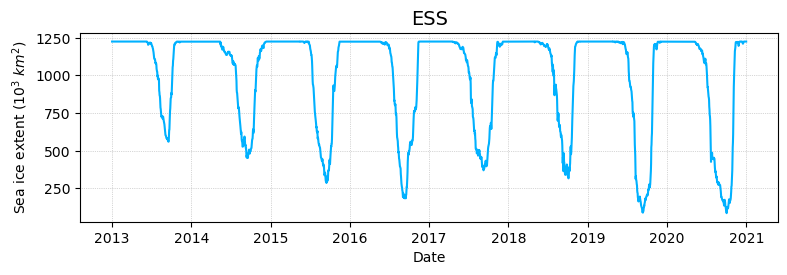

...

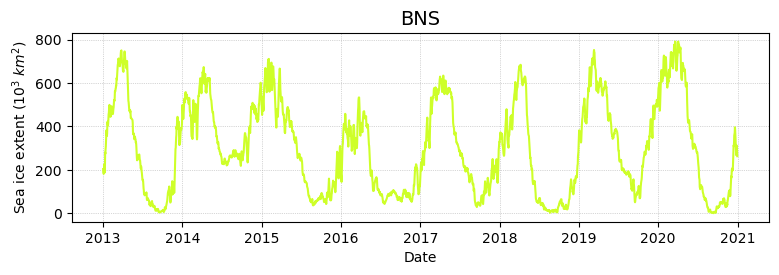

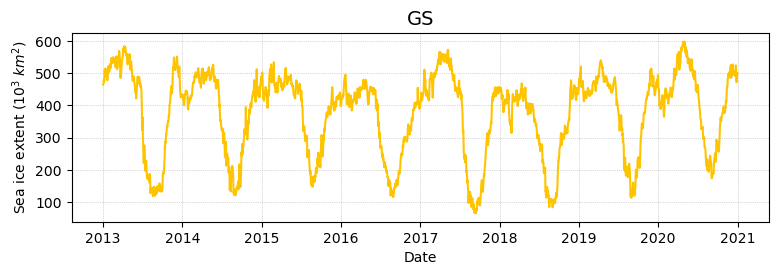

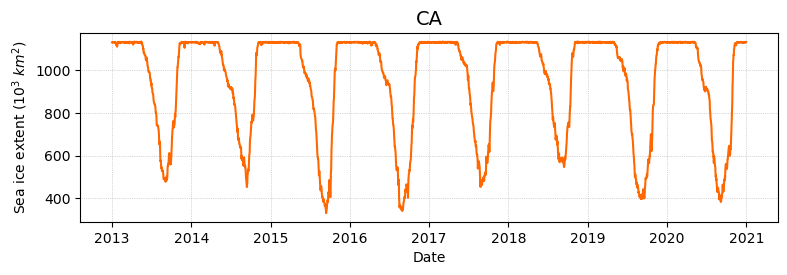

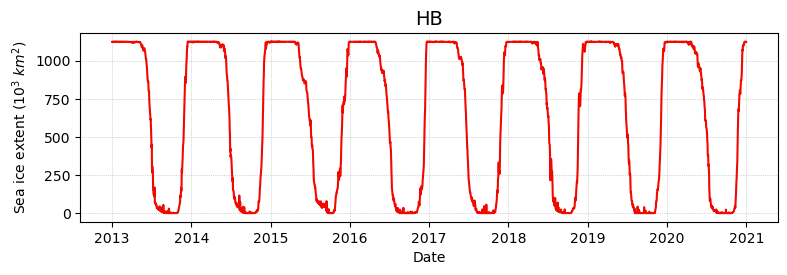

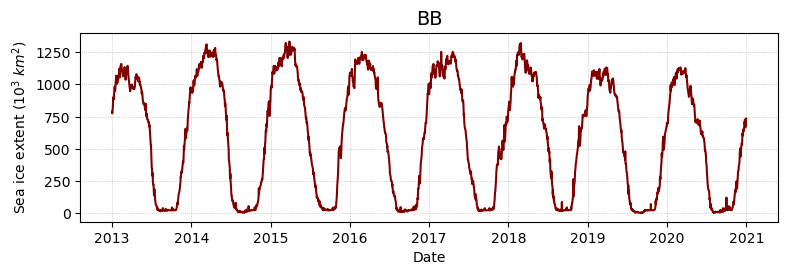

In [5]:
# Plots of daily SIE -----------------------------------

code = 0
for field in df_sie.keys()[3:]:
    plt.figure(figsize = (9,2.5), dpi=100)
    
    if code == 0:
        rgba = "k"
    else:
        cmap = cm.get_cmap('jet')
        rgba = cmap((code-1)/len(df_sie.keys()[5:]))
    
    plt.plot(df_sie['date'], df_sie[field]/1000, color = rgba)
    plt.xlabel("Date")
    plt.ylabel("Sea ice extent (${10^3}$ ${km^2}$)")
    plt.grid(ls = ":", lw = 0.5)
    plt.title(field, fontsize = 14)
    
    plt.savefig("result\\1_temporal\\Daily_SIE_{0}.png".format(field), bbox_inches = "tight")
    
    code += 1

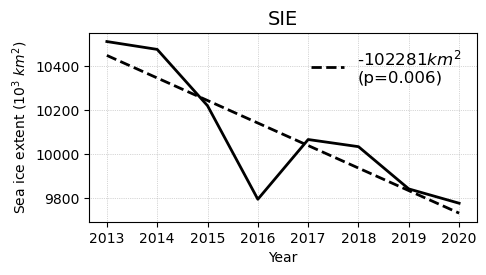

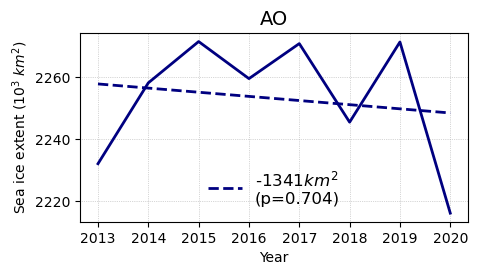

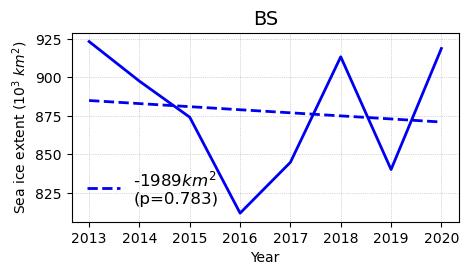

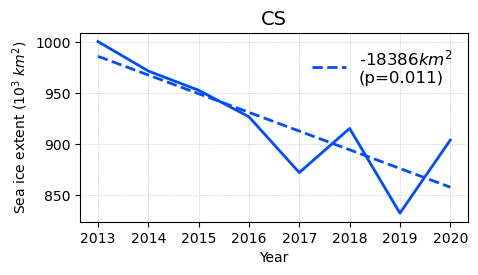

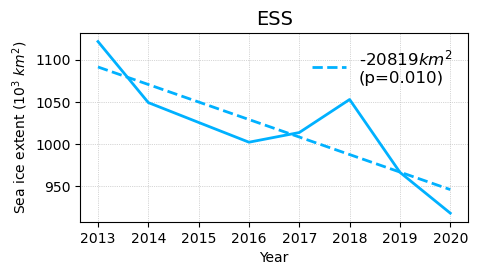

...

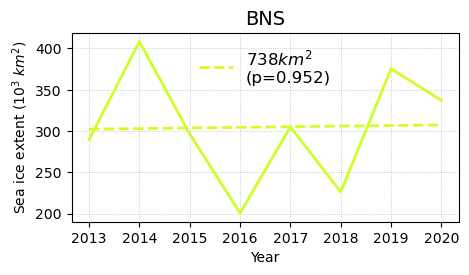

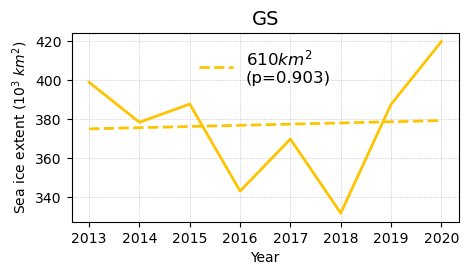

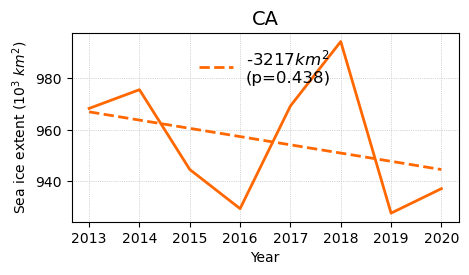

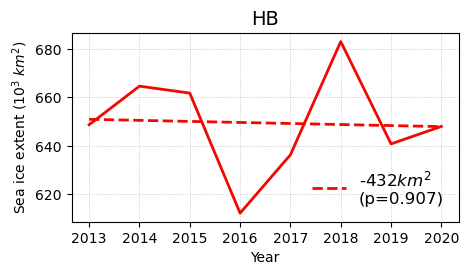

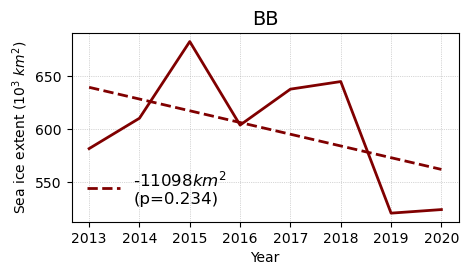

In [6]:
# Plots of yearly-averaged SIE -----------------------------------

import scipy.stats as sp # scipy for linear regression

df_year = df_sie.groupby(['year'], as_index=False).mean()
df_year_sd = df_sie.groupby(['year'], as_index=False).std()*0

code = 0
for field in df_year.keys()[2:]:
    plt.figure(figsize = (5,2.5), dpi=100)
    
    if code == 0:
        rgba = "k"
    else:
        cmap = cm.get_cmap('jet')
        rgba = cmap((code-1)/len(df_sie.keys()[5:]))
    
    # Linear regression to calculate linear decreasing rates
    x = df_year['year']
    y = df_year[field]
    a, b, r_value, p_value, std_err = sp.linregress(x,y)
    
    plt.plot(x, y/1000, color = rgba, lw = 2)
    plt.plot(x, (a*x+b)/1000, color = rgba, lw = 2, ls = "--", label = "%.0f${km^2}$\n(p=%.3f)"%(a, p_value))
#     plt.fill_between(x, y - df_year_sd[field]/1000, y + df_year_sd[field]/1000,
#                      alpha = 0.3, linewidth = 0, color = rgba)
    plt.xlabel("Year")
    plt.ylabel("Sea ice extent (${10^3}$ ${km^2}$)")
    plt.grid(ls = ":", lw = 0.5)
    plt.title(field, fontsize = 14)
    plt.legend(fontsize=12, frameon=False)
    plt.savefig("result\\1_temporal\\yearly_SIE_{0}.png".format(field), bbox_inches = "tight")
    
    code += 1

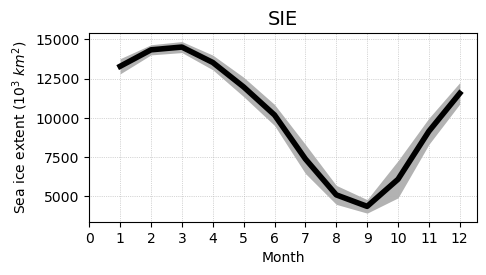

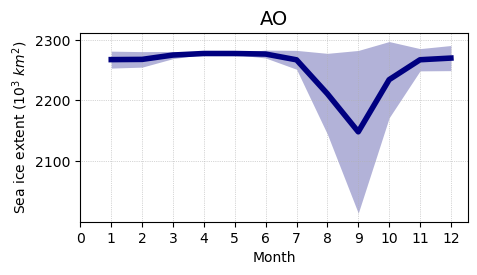

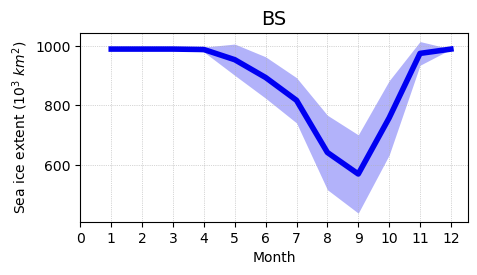

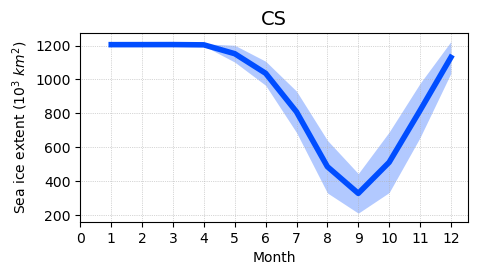

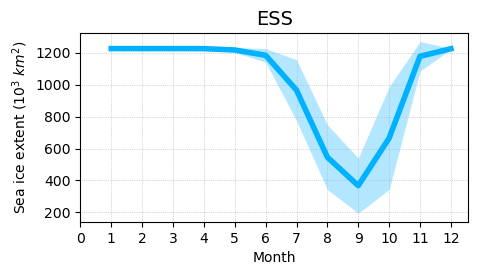

...

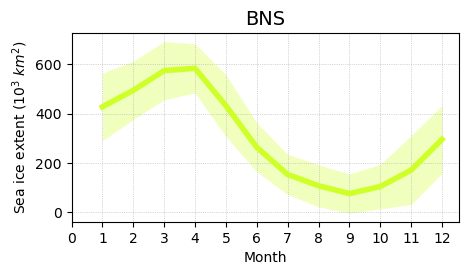

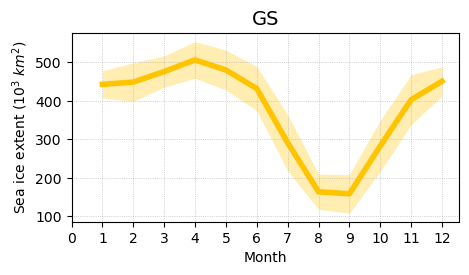

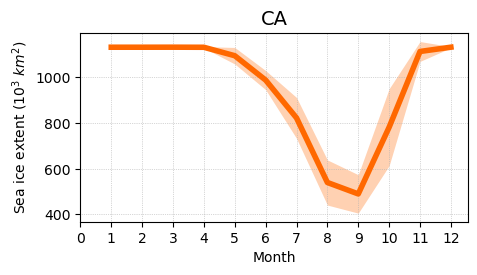

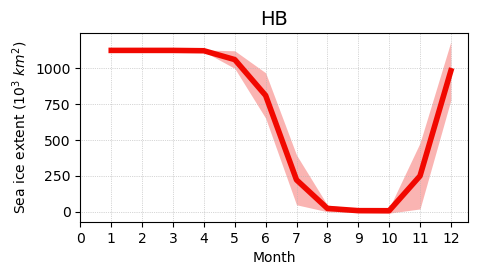

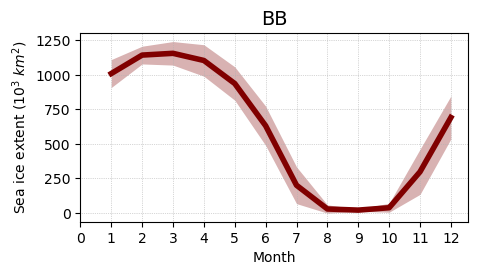

In [7]:
# Plots of SIE by month -----------------------------------

df_month = df_sie.groupby(['month'], as_index=False).mean()
df_month_sd = df_sie.groupby(['month'], as_index=False).std()

code = 0
months = np.arange(0, 13)
for field in df_year.keys()[2:]:
    plt.figure(figsize = (5,2.5), dpi=100)
    
    if code == 0:
        rgba = "k"
    else:
        cmap = cm.get_cmap('jet')
        rgba = cmap((code-1)/len(df_sie.keys()[5:]))
    
    plt.plot(df_month['month'], df_month[field]/1000, color = rgba, lw = 4)
    plt.fill_between(df_month['month'], df_month[field]/1000 - df_month_sd[field]/1000,
                     df_month[field]/1000 + df_month_sd[field]/1000,
                     alpha = 0.3, linewidth = 0, color = rgba)
    plt.xlabel("Month")
    plt.ylabel("Sea ice extent (${10^3}$ ${km^2}$)")
    plt.grid(ls = ":", lw = 0.5)
    plt.title(field, fontsize = 14)
    plt.xticks(months)
    
    plt.savefig("result\\1_temporal\\monthly_SIE_{0}.png".format(field), bbox_inches = "tight")
    
    code += 1

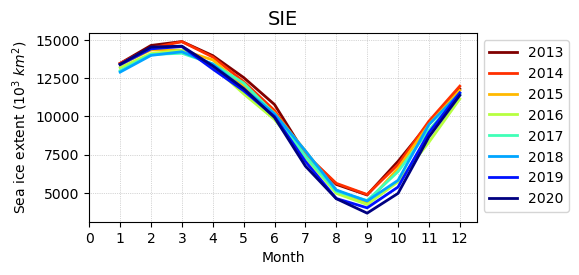

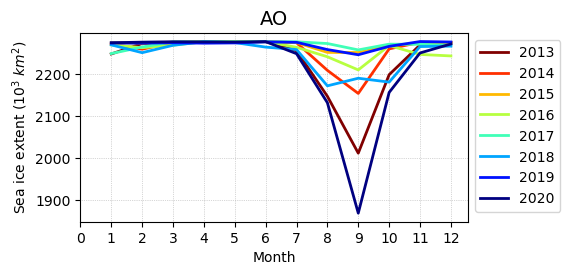

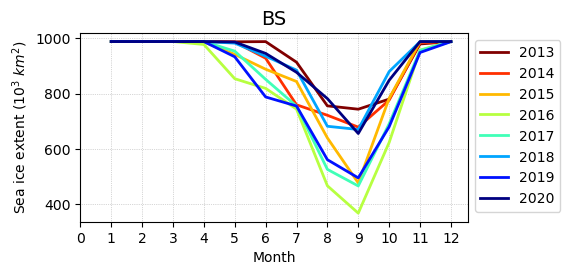

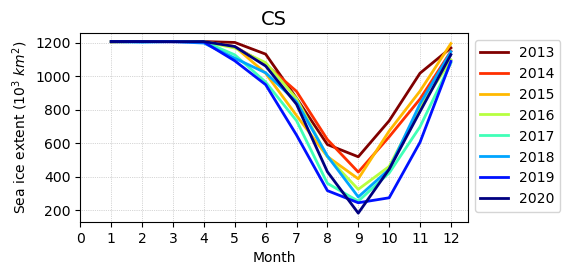

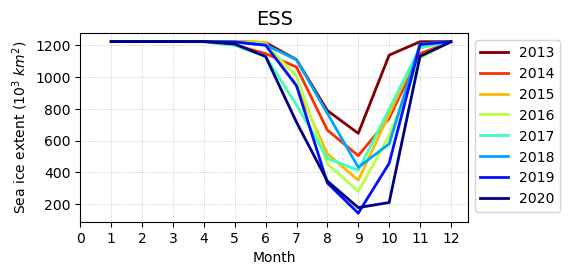

...

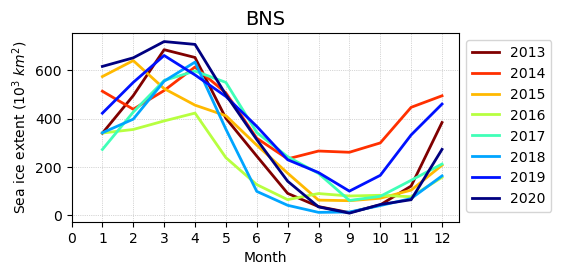

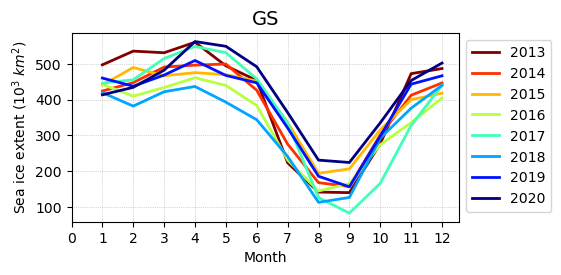

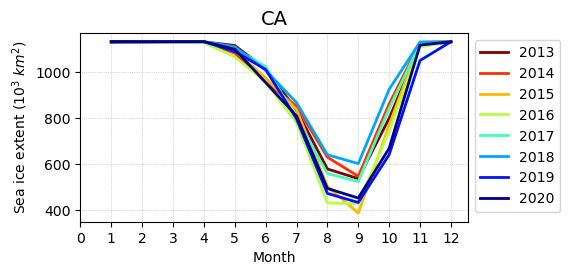

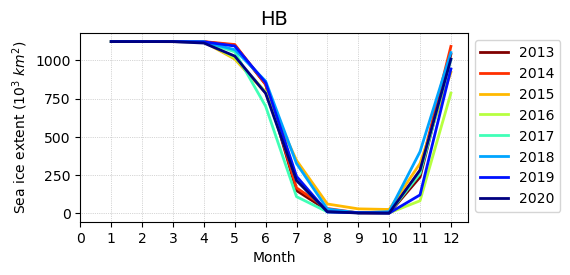

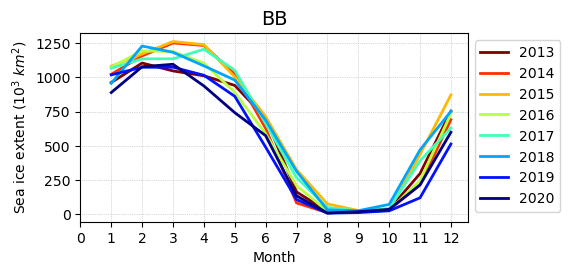

In [8]:
df_month = df_sie.groupby(['month', 'year'], as_index=False).mean()
df_month_sd = df_sie.groupby(['month', 'year'], as_index=False).std()

code = 0
months = np.arange(0, 13)
for field in df_month.keys()[2:]:
    
    plt.figure(figsize = (5,2.5), dpi=100)
    years = pd.unique(df_month['year'])
    
    for y in years:

        cmap = cm.get_cmap('jet')
        rgba = cmap((years.max()-y)/(years.max()-years.min()))
        
        data = df_month.loc[df_month['year'] == y, :]
        plt.plot(data['month'], data[field]/1000, lw = 2, label=y, color = rgba)

        plt.xlabel("Month")
        plt.ylabel("Sea ice extent (${10^3}$ ${km^2}$)")
        plt.grid(ls = ":", lw = 0.5)
        plt.title(field, fontsize = 14)
        plt.xticks(months)
        
    plt.legend(bbox_to_anchor=(1.0, 1))
    plt.savefig("result\\1_temporal\\monthly_SIE_by_year_{0}.png".format(field), bbox_inches = "tight")
    
    code += 1

### * Fourier Transformation (FFT)

In [44]:
from numpy.fft import fft, ifft

In [76]:
## Interpolated NaN values -------------------------------------------------
df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)
df_sie['date'] = pd.to_datetime(df_sie['date'])
df_sie = df_sie.loc[(df_sie['date'] < dt.datetime(2021, 1, 1)) &
                    (df_sie['date'] >= dt.datetime(2013, 1, 1)), :].reset_index(drop = True)

fields = df_sie.keys()[3:]
# Daily sampling from 2013 to 2020
dti = pd.date_range(start = "01/01/2013", end = "12/31/2020", freq = "D")

df0 = dti.to_frame(index = False, name = "date")

for i in range(0, len(df0)):
    idx = (df_sie['date'] == df0['date'][i])
    
    if len(idx[idx == True]) > 0:
        for field in fields:
            df0.loc[i, field] = df_sie.loc[idx, field].values[0]
        df0.loc[i, "interpolated"] = 0
    else:
        print(dti[i])
            
df1 = df0.interpolate()
df1.to_csv("result\\SIE_NH_interpolated.csv")

2013-05-11 00:00:00
2013-05-12 00:00:00
2013-05-13 00:00:00
2013-05-14 00:00:00
2015-12-03 00:00:00
2015-12-04 00:00:00
2016-04-15 00:00:00
2016-04-16 00:00:00
2017-09-28 00:00:00
2017-11-25 00:00:00
2018-12-16 00:00:00
2019-03-18 00:00:00
2019-03-19 00:00:00
2020-03-17 00:00:00


Processed ...  SIE
Freq:  [0.0, 0.003, 0.005, 0.002, 0.0, 0.001, 0.008, 0.003, 0.001, 0.004]
Period:  [inf, 365.25, 182.625, 487.0, 2922.0, 1461.0, 121.75, 324.667, 730.5, 243.5]
Processed ...  AO
Freq:  [0.0, 0.003, 0.005, 0.008, 0.011, 0.001, 0.003, 0.002, 0.001, 0.014]
Period:  [inf, 365.25, 182.625, 121.75, 91.312, 1461.0, 292.2, 487.0, 730.5, 73.05]
Processed ...  BS
Freq:  [0.0, 0.003, 0.005, 0.0, 0.008, 0.002, 0.001, 0.002, 0.003, 0.005]
Period:  [inf, 365.25, 182.625, 2922.0, 121.75, 487.0, 1461.0, 417.429, 324.667, 208.714]
Processed ...  CS
Freq:  [0.0, 0.003, 0.005, 0.0, 0.002, 0.002, 0.001, 0.007, 0.001, 0.004]
Period:  [inf, 365.25, 182.625, 2922.0, 417.429, 487.0, 1461.0, 146.1, 974.0, 243.5]
Processed ...  ESS
Freq:  [0.0, 0.003, 0.005, 0.008, 0.001, 0.003, 0.002, 0.001, 0.0, 0.002]
Period:  [inf, 365.25, 182.625, 121.75, 1461.0, 292.2, 487.0, 974.0, 2922.0, 584.4]
Processed ...  LS
Freq:  [0.0, 0.003, 0.005, 0.0, 0.008, 0.011, 0.001, 0.002, 0.003, 0.002]
Period:  [inf, 

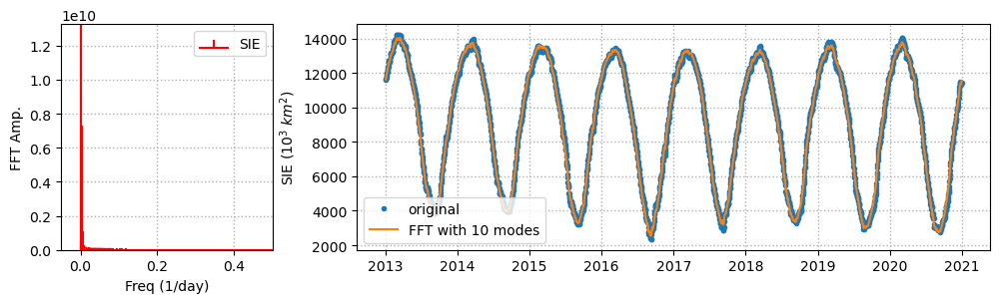

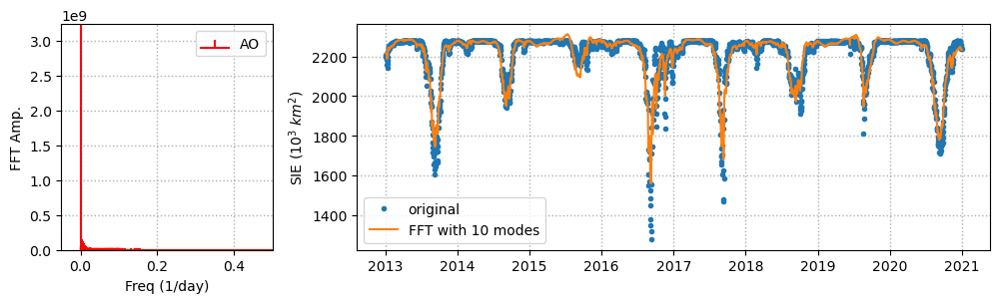

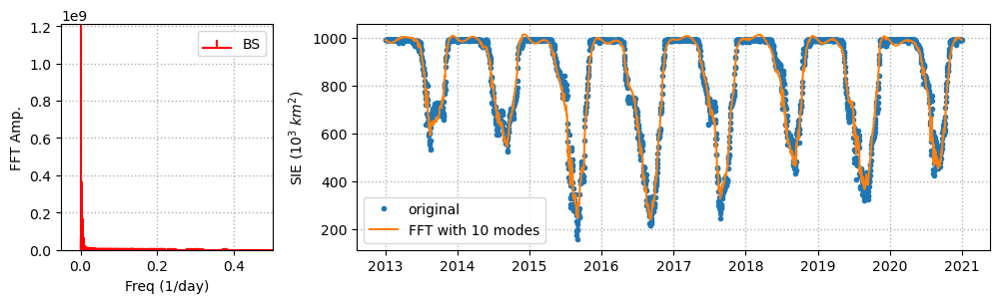

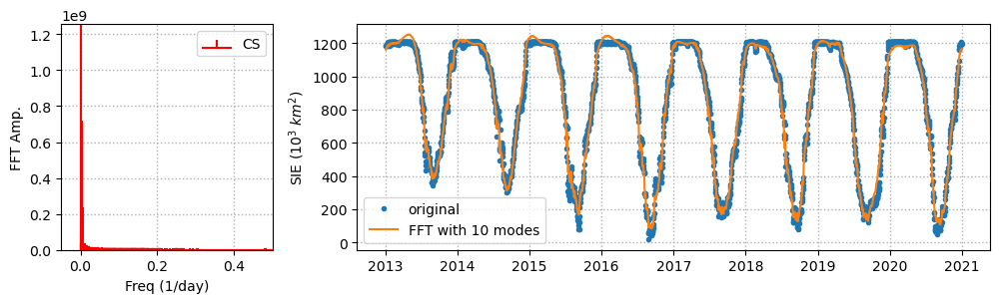

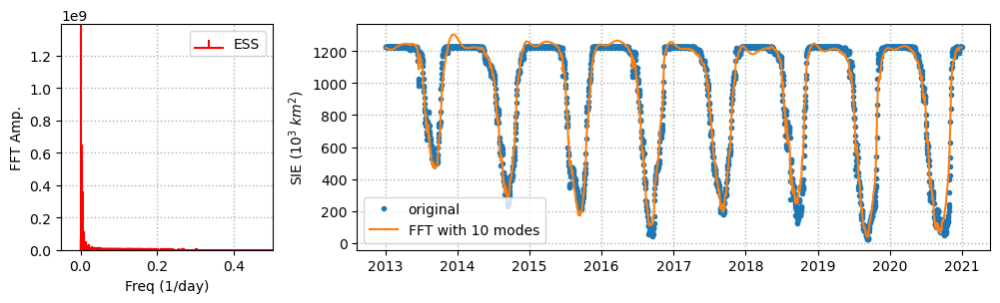

...

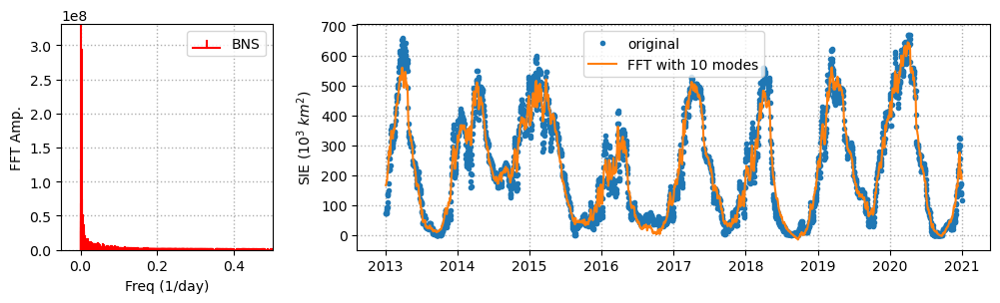

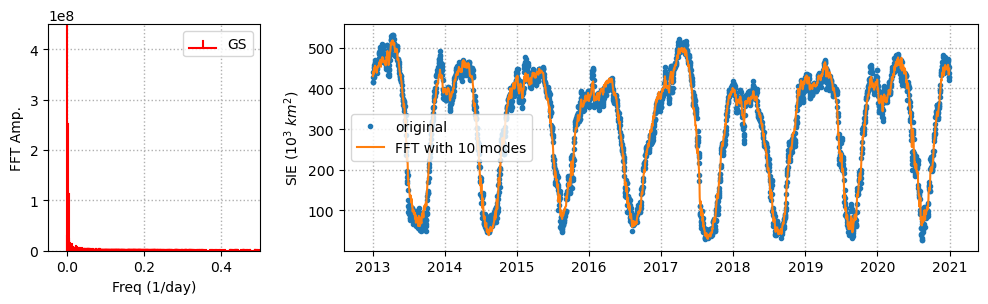

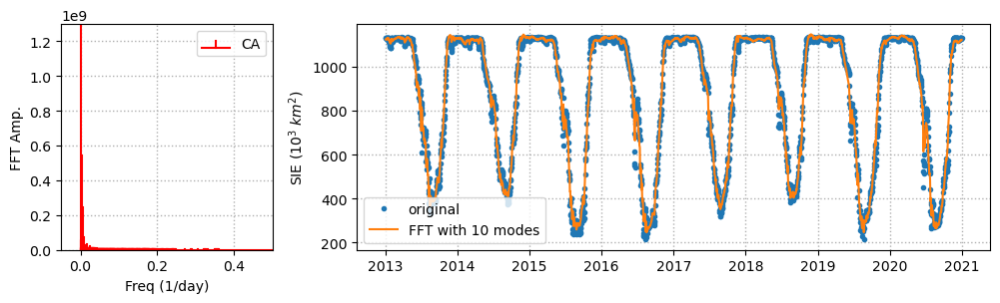

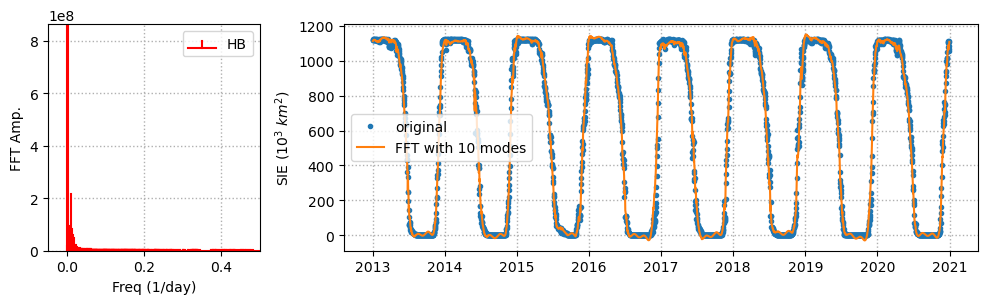

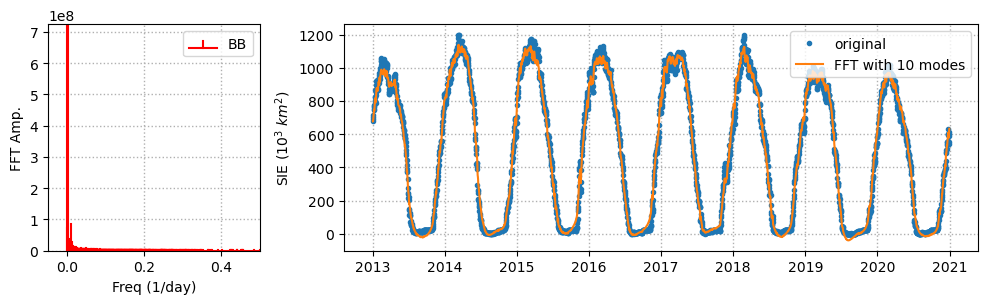

In [45]:
# FFT -----------------------------------------------------------------------------
df_sample = pd.read_csv("result\\SIE_NH_interpolated.csv", index_col = 0)
df_sample['date'] = pd.to_datetime(df_sample['date'])
top_rank = 10

for field in df_sample.keys()[1:]:
    fig, ax = plt.subplots(1, 2, figsize = (12, 3), dpi = 100, gridspec_kw={'width_ratios': [1,3]})

    X=fft(df_sample[field])
    N=len(X)
    n = np.arange(N)
    
    sr = 1 # sampling ratio = one day
    T= N/sr
    freq=n/T
    
    # LEFT panel: draw FFT amplitudes by frequencies
    ax[0].stem(freq, np.abs(X), markerfmt=" ", basefmt="red", linefmt = "red", label = field)
    ax[0].set_ylabel('FFT Amp.')
    ax[0].set_xlabel('Freq (1/day)')
    ax[0].legend()
    # set y-axis limit
    ax[0].set_ylim(0, np.abs(X).max()/2)
    ax[0].grid(linestyle = ":", linewidth = 1)
    ax[0].set_xlim(-0.05, 0.5)    
    
    # Select top 10 mode frequencies for the data reconstruction
    X[np.argsort(np.abs(X[:int(N/2)]))[:-top_rank]] = 0
    Y = ifft(X)
    
    # RIGHT panel: draw the original daily data and the reconstructed data
    ax[1].plot(df_sample['date'], df_sample[field]/1000, '.', label = "original")
    ax[1].plot(df_sample['date'], Y/1000, label = "FFT with {0} modes".format(top_rank))
    ax[1].set_ylabel("SIE (${10^3}$ ${km^2}$)")
    ax[1].legend()
    ax[1].grid(linestyle = ":", linewidth = 1)
    
    top_freq = [round(f, 3) for f in freq[np.argsort(-np.abs(X[:int(N/2)]))[:top_rank]]]
    top_period = [round(1/f, 3) for f in freq[np.argsort(-np.abs(X[:int(N/2)]))[:top_rank]]]
    
    print("Processed ... ", field)
    print("Freq: ", top_freq)
    print("Period: ", top_period)
    print("=============================================")
    plt.savefig("result\\1_temporal\\FFT_top{0}_{1}.png".format(top_rank, field), bbox_inches = "tight")
    

## 2. Dendrogram

In [9]:
from scipy.cluster import hierarchy
from turbustat.statistics import Dendrogram_Stats
from astrodendro import Dendrogram

2013
2014
2015
2016
2017
2018
2019
2020


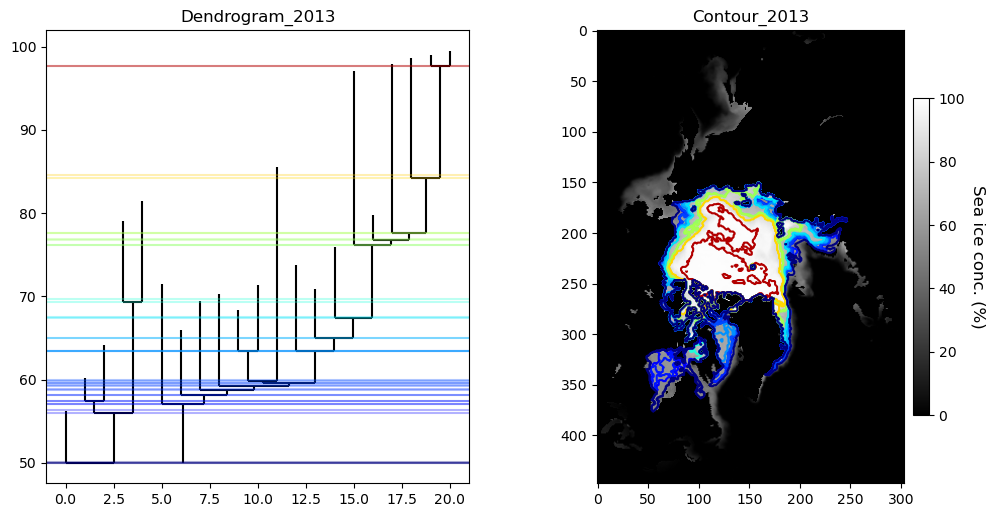

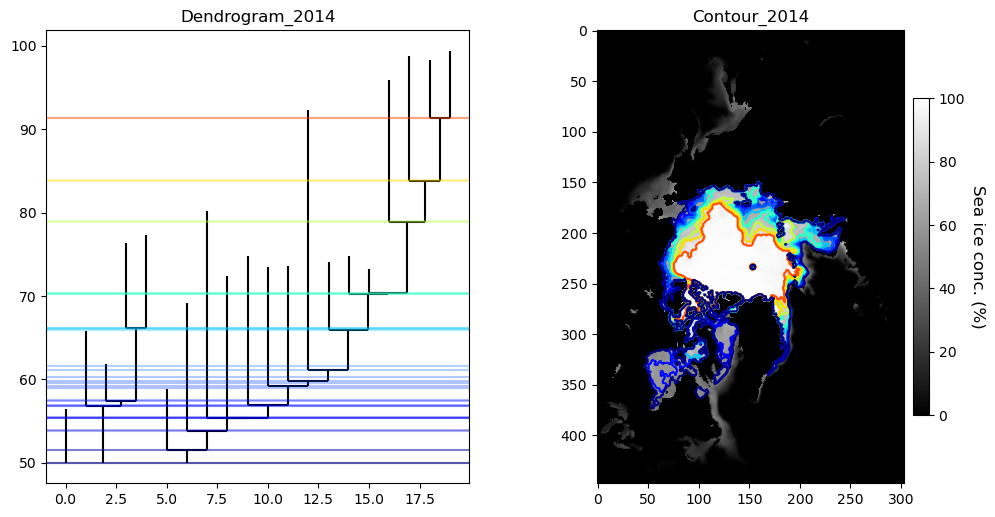

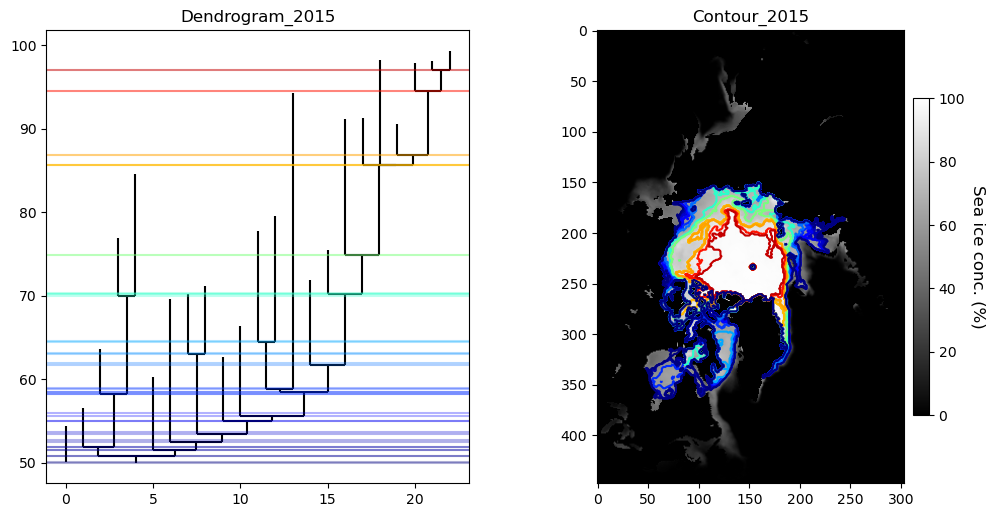

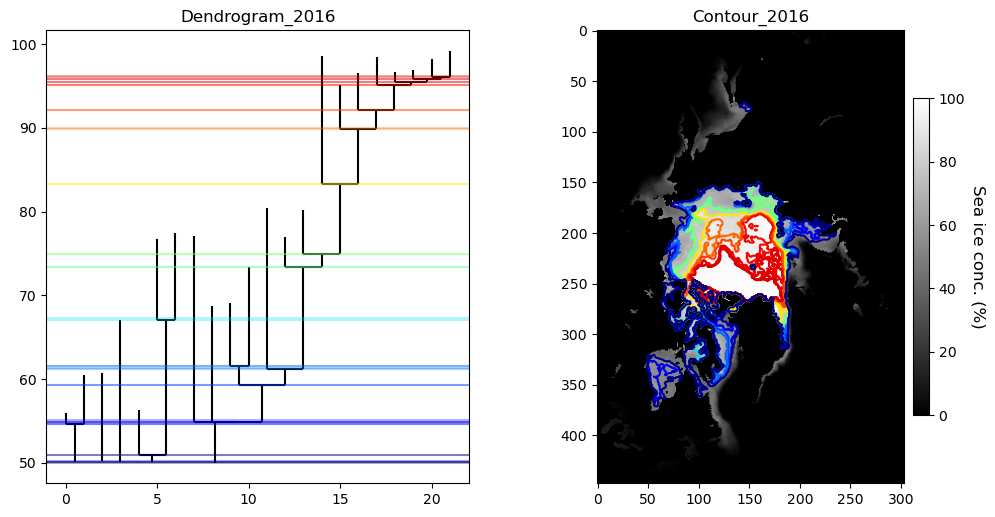

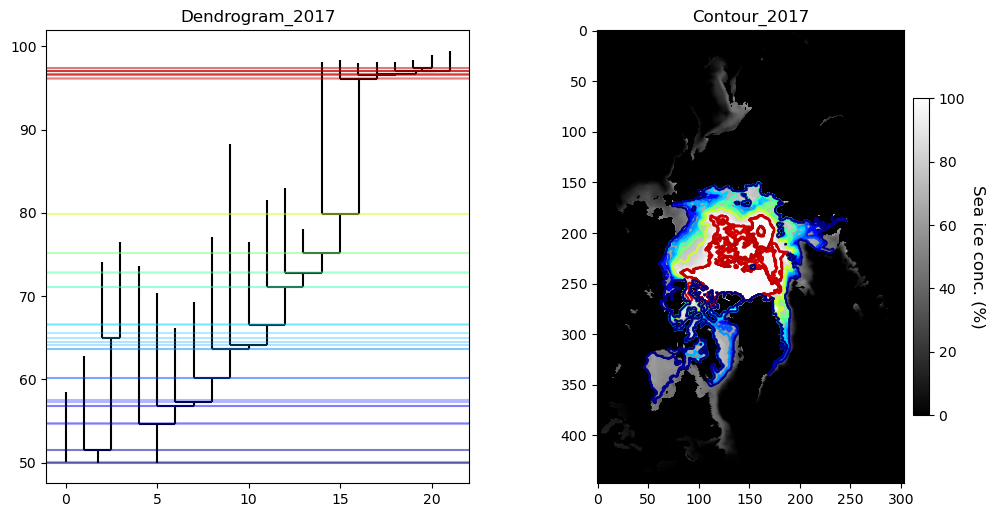

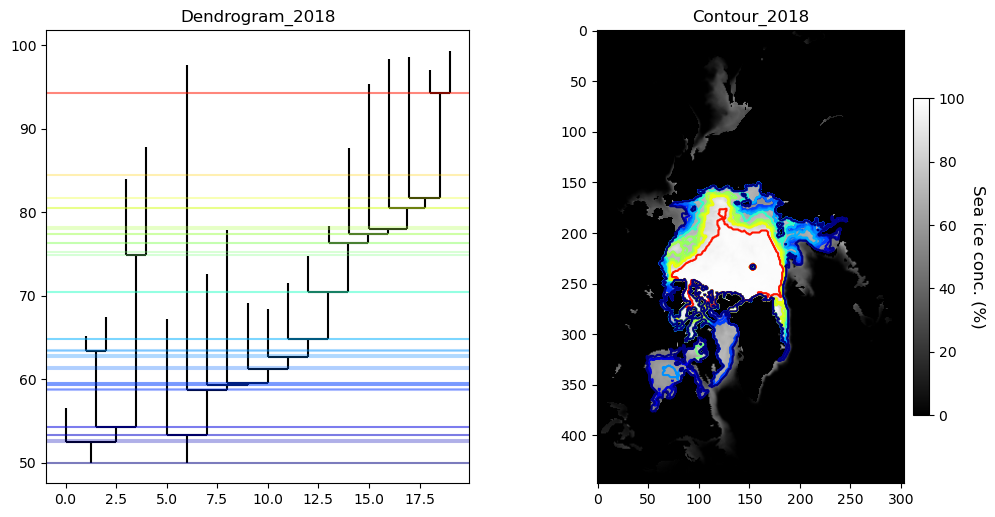

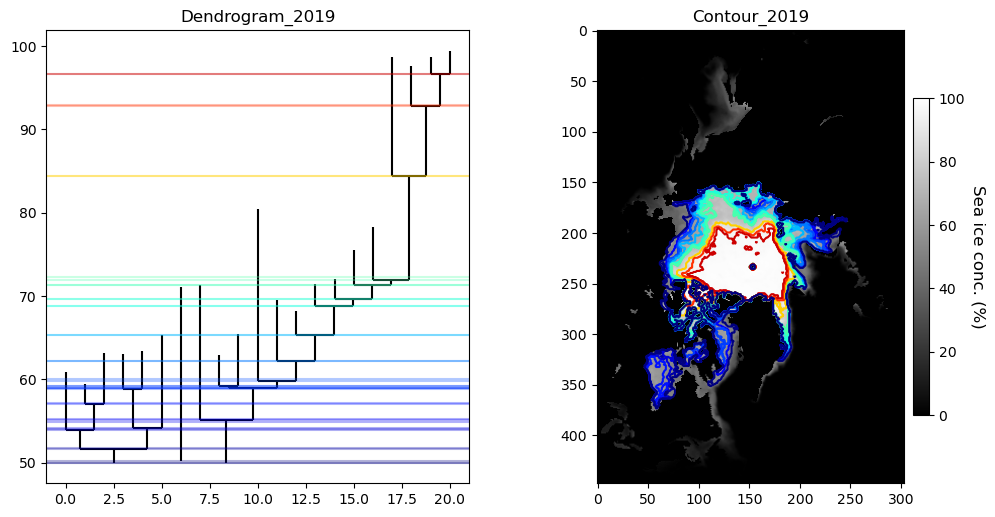

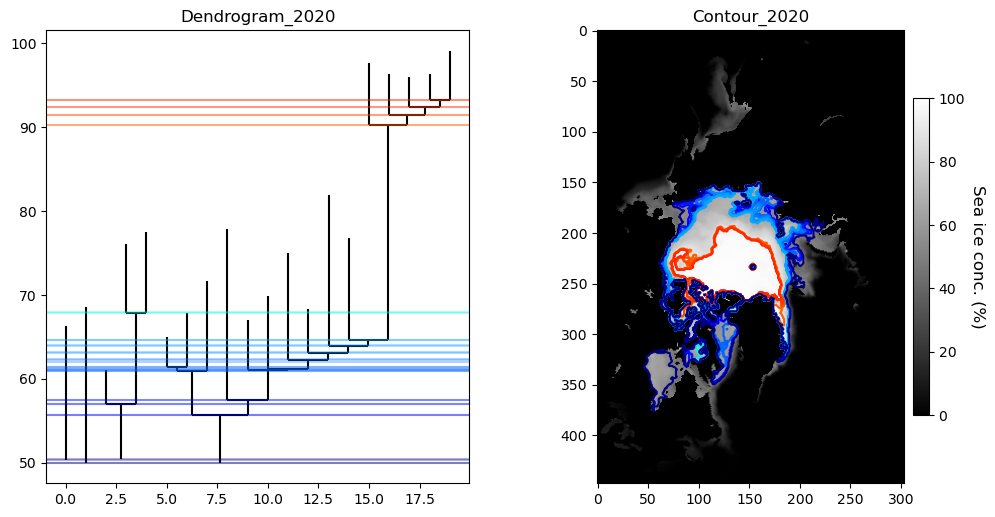

In [10]:
# Yearly demdrograms --------------------------------------
df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

for y in range(2013, 2021): #df_sie['year'].unique()[:]:
    t0_str = str(y)

    min_sic = 50 # minimum SIC level to draw dendrogram
    fig, ax =  plt.subplots(1, 2, figsize = (12, 6), dpi = 100)
    idx = (df_sie['year'] == y)
    sic_mean = np.mean(sic_con[:, :, idx], axis = 2)
    
    # Compute dendrograms with yearly-averaged SIC
    d = Dendrogram.compute(sic_mean, min_value=min_sic, min_delta=1, min_npix=40, verbose=False) 
    p = d.plotter()

    # Draw dendrogram (left: dendrograms, right: contour maps)
    p.plot_tree(ax[0], color='black')
    p.get_lines()

    ax[0].set_title("Dendrogram_{0}".format(t0_str))

    img = ax[1].imshow(sic_mean, cmap="gray", vmin = 0, vmax=100)
    clb = fig.colorbar(img, ax = ax[1], shrink = 0.7, pad = 0.02)
    clb.set_label('Sea ice conc. (%)', rotation = 270, fontsize = 12, va = 'bottom')

    cmap = cm.get_cmap('jet')

    k = 0; num = len(d.leaves)

    for trk in d.trunk:
        if len(trk.descendants) > 0:
            for des in trk.descendants:
                rgba = cmap((des.vmin-min_sic)/(100-min_sic))
                p.plot_contour(ax[1], structure=des.idx, lw=0.5, colors=np.array(rgba).reshape(-1,4))
                ax[0].axhline(des.vmin, color = rgba, alpha = 0.3, label = des.level)
        rgba = cmap((trk.vmin-min_sic)/(100-min_sic))
        p.plot_contour(ax[1], structure=trk.idx, lw=0.5, colors=np.array(rgba).reshape(-1,4))
        ax[0].axhline(trk.vmin, color = rgba, alpha = 0.3, label = trk.level)

    ax[1].set_title("Contour_{0}".format(t0_str))

    plt.savefig("result\\2_dendrogram\\dendro_{0}.png".format(t0_str), bbox_inches = "tight")
        
    print(y)

## 3. Statistical moments (skewness & kurtosis)

In [309]:
# Get statistical moments (skewness & kurtosis) -----------------
from scipy.stats import kurtosis, skew

def get_statistics(z, r = 5):
    h,w = np.shape(z)
    z_mean = np.zeros((h, w)) # Mean
    z_std = np.zeros((h, w)) # Standard deviations
    z_skew = np.zeros((h, w)) # skewness
    z_kurt = np.zeros((h, w)) # kurtosis
    
    for i in range(0, h):
        for j in range(0, w):
            part = z[max(0, i-r):min(h, i+r), max(0, j-r):min(w, j+r)]
            part = part[part > 0] # only calculate for valid part (exclude 0 SIC and land area)
            z_mean[i,j] = np.mean(part)
            z_std[i,j] = np.std(part)
            z_skew[i,j] = skew(part.flatten())
            z_kurt[i,j] = kurtosis(part.flatten())
    
    return z_mean, z_std, z_skew, z_kurt

2013
2014
2015
2016
2017
2018
2019
2020


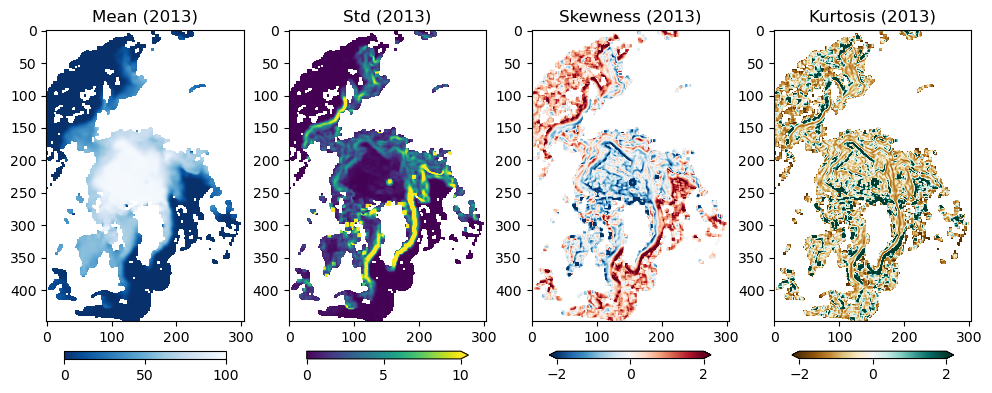

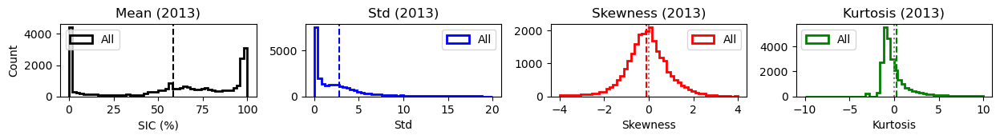

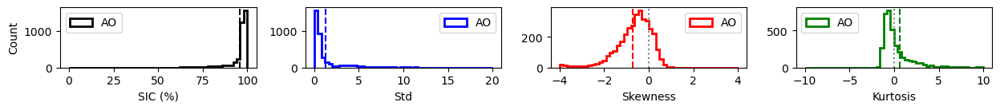

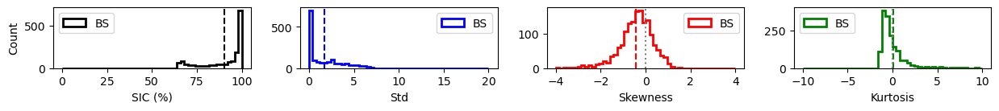

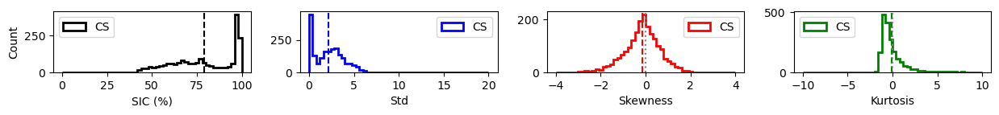

...

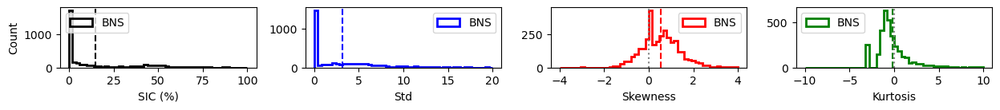

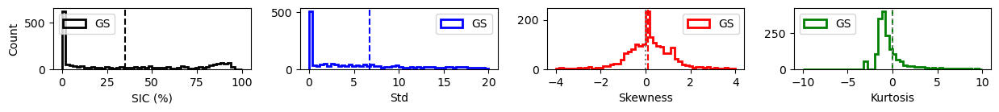

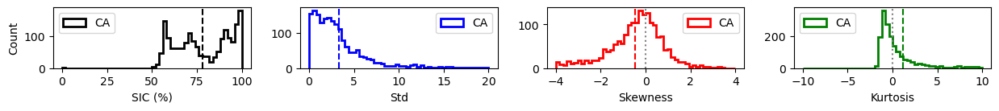

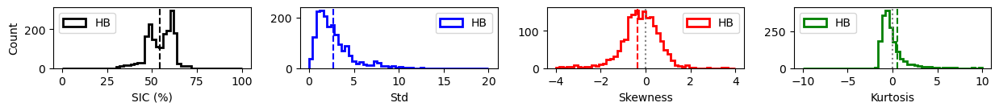

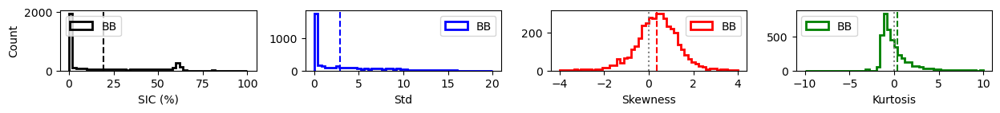

In [313]:
## Yearly skewness & kurtosis ---------------------------------
df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

for r in [3]: # r = smoothing factor (i.e. window size)
    for y in range(2013, 2021):
        idx = (df_sie['year'] == y)
        sic_mean = np.mean(sic_con[:, :, idx], axis = 2)

        t0_str = str(y)
        
        z_mean, z_std, z_skew, z_kurt = get_statistics(sic_mean, r) # calculate statistical moments

        # Draw mean, std, skewness, and kurtosis maps =================================
        fig, ax = plt.subplots(1, 4, figsize = (12, 5), dpi = 100) 
        ax_mean = ax[0]
        ax_std = ax[1]
        ax_skew = ax[2]
        ax_kurt = ax[3]

        # Draw mean MAP
        img_mean = ax_mean.imshow(z_mean, cmap = 'Blues_r', vmin = 0, vmax = 100)
        clb = fig.colorbar(img_mean, ax = ax_mean, shrink = 0.8, pad = 0.08, orientation="horizontal")
        # clb.set_label('Sea ice conc. (%)')
        ax_mean.set_title("Mean ({0})".format(t0_str))

        # Draw std MAP
        img_std = ax_std.imshow(z_std, vmin = 0, vmax = 10)
        clb = fig.colorbar(img_std, ax = ax_std, shrink = 0.8, pad = 0.08, orientation="horizontal", extend="max")
        ax_std.set_title("Std ({0})".format(t0_str))

        # Draw skewness MAP
        img_skew = ax_skew.imshow(z_skew, cmap = "RdBu_r", vmin = -2, vmax = 2)
        fig.colorbar(img_skew, ax = ax_skew, shrink = 0.8, pad = 0.08, orientation="horizontal", extend="both")
        ax_skew.set_title("Skewness ({0})".format(t0_str))

        # Draw kurtosis MAP
        img_kurt = ax_kurt.imshow(z_kurt, cmap = "BrBG", vmin = -2, vmax = 2)
        fig.colorbar(img_kurt, ax = ax_kurt, shrink = 0.8, pad = 0.08, orientation="horizontal", extend="both")
        ax_kurt.set_title("Kurtosis ({0})".format(t0_str))

        plt.savefig("result\\3_stat_moments\\stat_moments_r{0}_{1}_map.png".format(r, t0_str), bbox_inches = "tight")
#         plt.close()

        # Draw histograms of mean, std, skewness, and kurtosis (entire Arctic) =================================
        fig, ax = plt.subplots(1, 4, figsize = (15, 1.2), dpi = 100)
        plt.subplots_adjust(wspace=0.25) 
        ax_mean = ax[0]
        ax_std = ax[1]
        ax_skew = ax[2]
        ax_kurt = ax[3]
        n_bin = 50

        # Draw mean HISTOGRAM 
        ax_mean.hist(z_mean[subregion>=0].flatten(), bins = n_bin, range = (0,100), histtype = 'step', density = False,
                     color = "k", lw = 2, label = "All")
        ax_mean.axvline(np.nanmean(z_mean[subregion>=0].flatten()), color = "k", ls = "--")
        ax_mean.set_xlabel("SIC (%)")
        ax_mean.set_ylabel("Count")
        ax_mean.legend(loc = "upper left")
        ax_mean.set_title("Mean ({0})".format(t0_str))

        # Draw variance HISTOGRAM 
        ax_std.hist(z_std[subregion>=0].flatten(), bins = n_bin, range = (0, 20), histtype = 'step', density = False,
                    color = "b", lw = 2, label = "All")
        ax_std.axvline(np.nanmean(z_std[subregion>=0].flatten()), color = "b", ls = "--")
        ax_std.set_xlabel("Std")
        ax_std.legend(loc = "upper right")
        ax_std.set_title("Std ({0})".format(t0_str))

        # Draw skewness HISTOGRAM 
        ax_skew.hist(z_skew[subregion>=0].flatten(), bins = n_bin, range = (-4, 4), histtype = 'step', density = False,
                     color = "r", lw = 2, label = "All")        
        ax_skew.axvline(np.nanmean(z_skew[subregion>=0].flatten()), color = "r", ls = "--")
        ax_skew.axvline(0, color = "gray", ls = ":")
        ax_skew.set_xlabel("Skewness")
        ax_skew.legend(loc = "upper right")
        ax_skew.set_title("Skewness ({0})".format(t0_str))

        # Draw kurtosis HISTOGRAM 
        ax_kurt.hist(z_kurt[subregion>=0].flatten(), bins = n_bin, range = (-10, 10), histtype = 'step', density = False,
                     color = "g", lw = 2, label = "All")
        ax_kurt.axvline(np.nanmean(z_kurt[subregion>=0].flatten()), color = "g", ls = "--")
        ax_kurt.axvline(0, color = "gray", ls = ":")
        ax_kurt.set_xlabel("Kurtosis")
        ax_kurt.legend(loc = "upper left")
        ax_kurt.set_title("Kurtosis ({0})".format(t0_str))

        plt.savefig("result\\3_stat_moments\\stat_moments_r{0}_{1}_hist.png".format(r, t0_str), bbox_inches = "tight")
#         plt.close()

        # Draw histograms of mean, std, skewness, and kurtosis (each subregion) =================================
        fields = df_sie.keys()[4:]
        for i in range(0, len(fields)):
            field = fields[i] # field = name of the sub-region
            fig, ax = plt.subplots(1, 4, figsize = (15, 1), dpi = 100)
            plt.subplots_adjust(wspace=0.25) 
            ax_mean = ax[0]
            ax_std = ax[1]
            ax_skew = ax[2]
            ax_kurt = ax[3]
            n_bin = 50

            # Draw mean HISTOGRAM
            ax_mean.hist(z_mean[subregion==i].flatten(), bins = n_bin, range = (0,100), histtype = 'step', density = False,
                         color = "k", lw = 2, label = field)
            ax_mean.axvline(np.nanmean(z_mean[subregion==i].flatten()), color = "k", ls = "--")
            ax_mean.set_xlabel("SIC (%)")
            ax_mean.set_ylabel("Count")
            ax_mean.legend(loc = "upper left")
#             ax_mean.set_title("Mean ({0})".format(t0_str))

            # Draw variance HISTOGRAM 
            ax_std.hist(z_std[subregion==i].flatten(), bins = n_bin, range = (0, 20), histtype = 'step', density = False,
                        color = "b", lw = 2, label = field)
            ax_std.axvline(np.nanmean(z_std[subregion==i].flatten()), color = "b", ls = "--")
            ax_std.set_xlabel("Std")
            ax_std.legend(loc = "upper right")
#             ax_std.set_title("Std ({0})".format(t0_str))

            # Draw skewness HISTOGRAM 
            ax_skew.hist(z_skew[subregion==i].flatten(), bins = n_bin, range = (-4, 4), histtype = 'step', density = False,
                         color = "r", lw = 2, label = field)        
            ax_skew.axvline(np.nanmean(z_skew[subregion==i].flatten()), color = "r", ls = "--")
            ax_skew.axvline(0, color = "gray", ls = ":")
            ax_skew.set_xlabel("Skewness")
            ax_skew.legend(loc = "upper right")
#             ax_skew.set_title("Skewness ({0})".format(t0_str))

            # Draw kurtosis HISTOGRAM 
            ax_kurt.hist(z_kurt[subregion==i].flatten(), bins = n_bin, range = (-10, 10), histtype = 'step', density = False,
                         color = "g", lw = 2, label = field)
            ax_kurt.axvline(np.nanmean(z_kurt[subregion==i].flatten()), color = "g", ls = "--")
            ax_kurt.axvline(0, color = "gray", ls = ":")
            ax_kurt.set_xlabel("Kurtosis")
            ax_kurt.legend(loc = "upper left")
#             ax_kurt.set_title("Kurtosis ({0})".format(t0_str))

            plt.savefig("result\\3_stat_moments\\stat_moments_r{0}_{1}_hist_{2}_{3}.png".format(r, t0_str, str(i).zfill(2), fields[i]), bbox_inches = "tight")
#             plt.close()

        print(t0_str)

## 4. Principal Component Analysis (PCA)

In [256]:
# Import sklearn PCA package
from sklearn.decomposition import PCA

In [261]:
## Functions for conducting PCA analysis
def reshape_pca(sic_con):
    # Reshape 3D sic_con array into 2D array for PCA analysis
    h, w, s = np.shape(sic_con)
    pca_in = np.zeros((h*w, s))
    for i in range(0, h):
        for j in range(0, w):
            pca_in[i + j*h, :] = sic_con[i, j, :]
    return pca_in

def decomposition_pca(p, n, lat):
    # Reshape 2D PCA components into 3D arrays (original grids)
    # p: pca components
    # n: number of PCA components    
    h, w = np.shape(lat)
    out = np.zeros((h, w, n))
    
    for i in range(0, h):
        for j in range(0, w):
            out[i, j, :] = p[i + j*h, :n]
            
    return out

def draw_pca(pca_c, pca_var, imgname):
    # Plot the first 6 PCA components on 6 panels
    fig, ax = plt.subplots(2,3,figsize = (14, 10), dpi = 80)
    h, w = np.shape(ax)
    
    n = 0
    for i in range(0, h):
        for j in range(0, w):
            plt.subplot2grid((h, w), (i,j))
            plt.imshow(pca_c[:, :, n])  
            plt.colorbar(shrink = 0.8)
            plt.title("PCA_{0} (var: {1})".format(n+1, pca_var[n].round(3)))
            plt.text(10, 30, imgname.split(".png")[0][-4:], color = "white", fontsize = 12)
            n+=1
            
    plt.savefig(imgname, bbox_inches = "tight")

2020


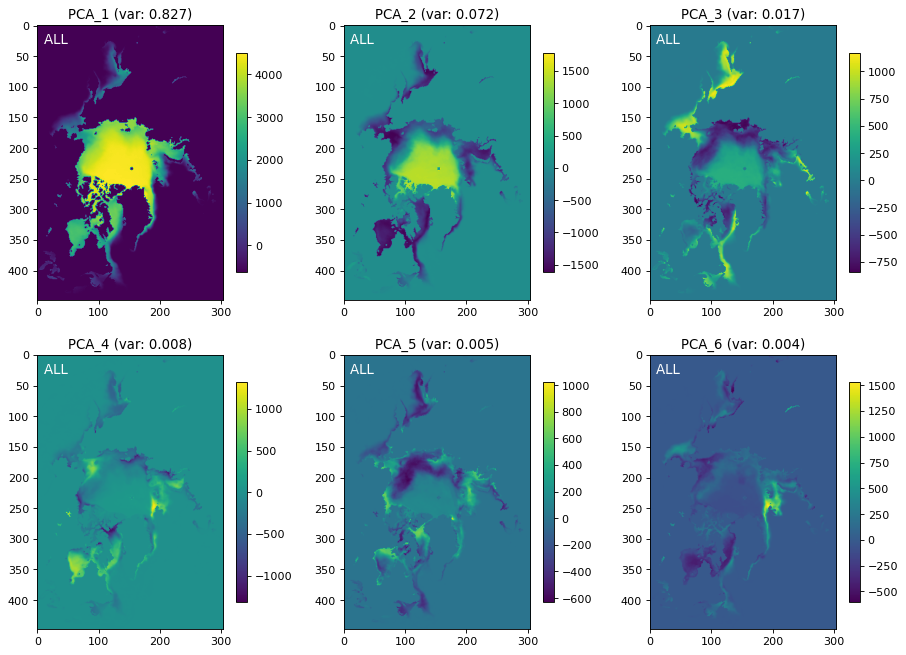

In [263]:
# PCA analysis for the entire 8-year data (original dimension: 2908) ----------------------------

df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

idx = (df_sie['year'] >= 2013) & (df_sie['year'] <= 2020)
sic_part = sic_con[:, :, idx]

# PCA analysis
n = 10
pca_in = reshape_pca(sic_part) # make input for PCA
pca = PCA(n_components=n)
pca_c0 = pca.fit_transform(pca_in) # PCA tranformation
pca_c = decomposition_pca(pca_c0, n, lat) # convert 2D array into original 3D array again
pca_var = pca.explained_variance_ratio_
del pca_c0, pca_in

imgname = "result\\4_PCA\\PCA_ALL .png"
draw_pca(pca_c, pca_var, imgname)

print(y)

2013
2014
2015
2016
2017
2018
2019
2020


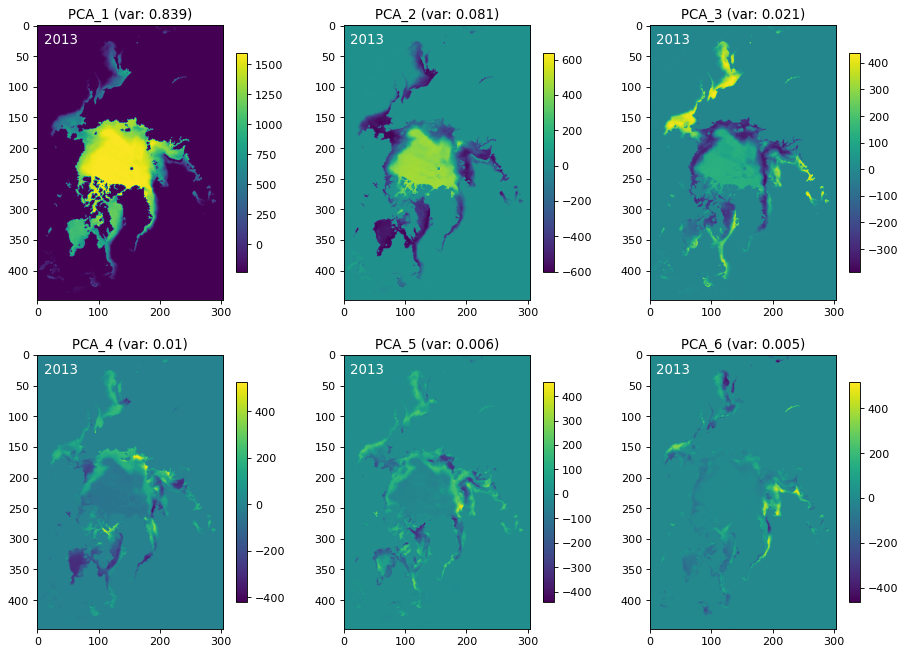

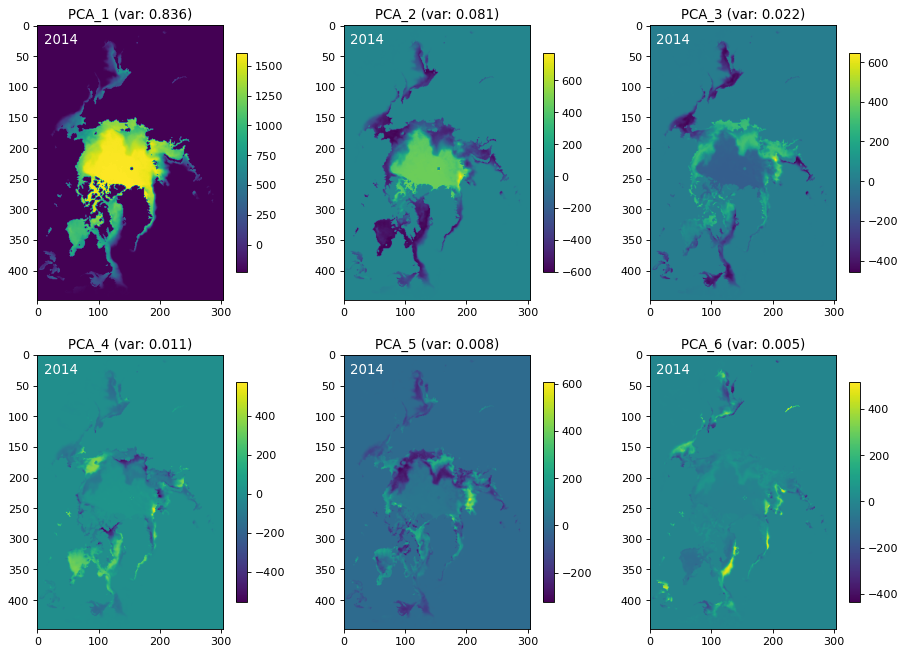

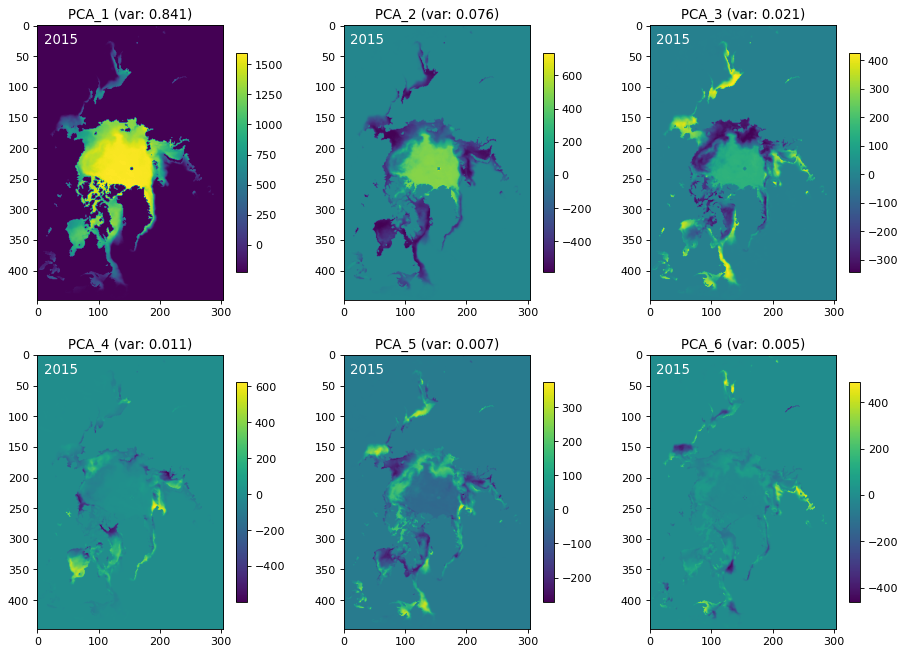

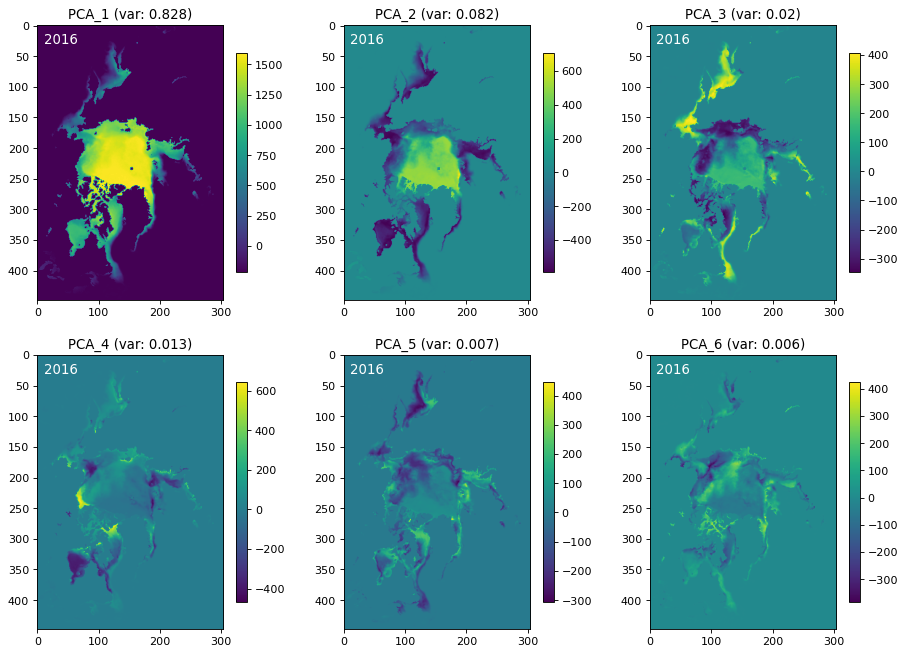

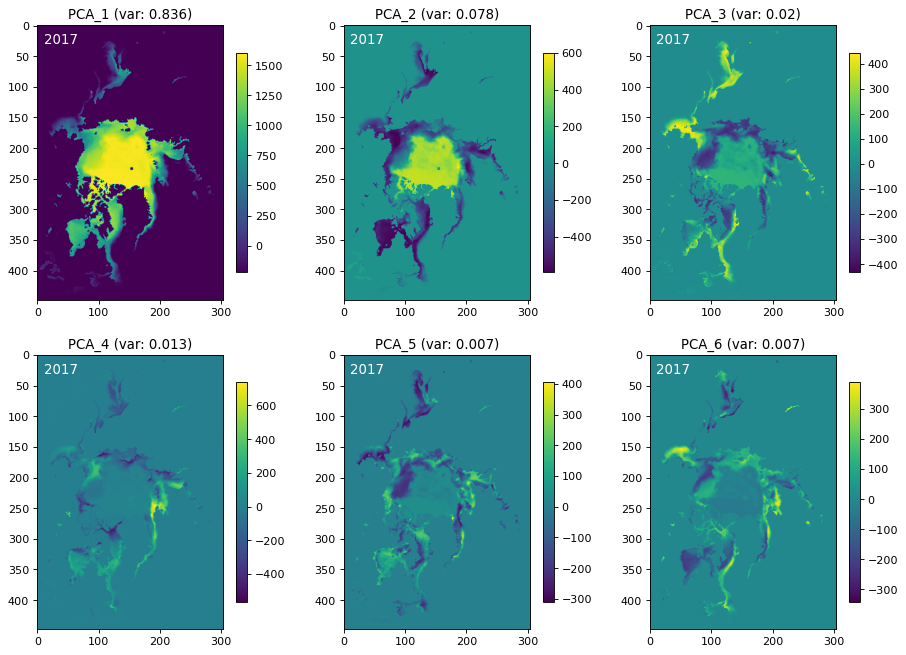

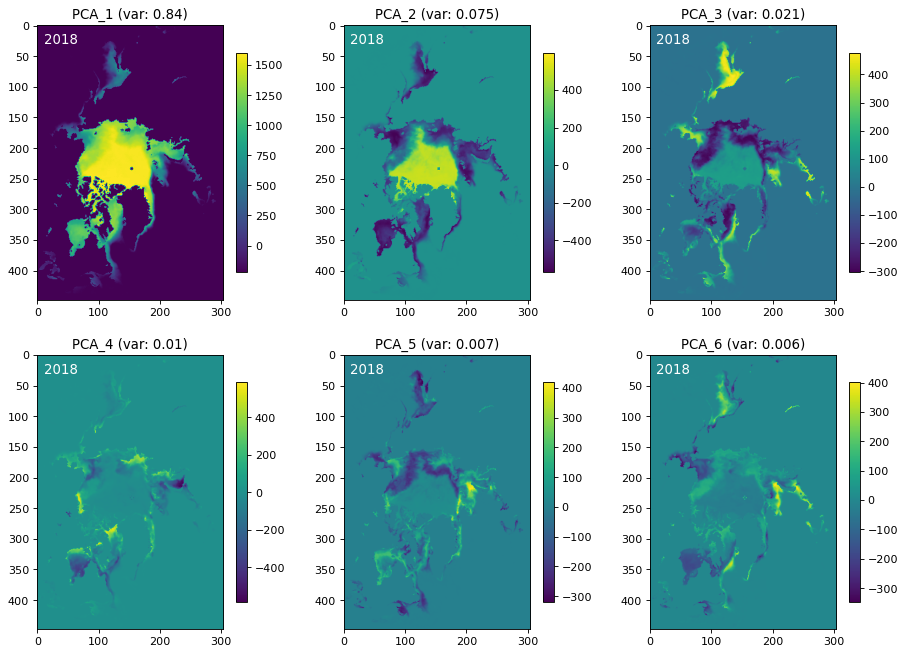

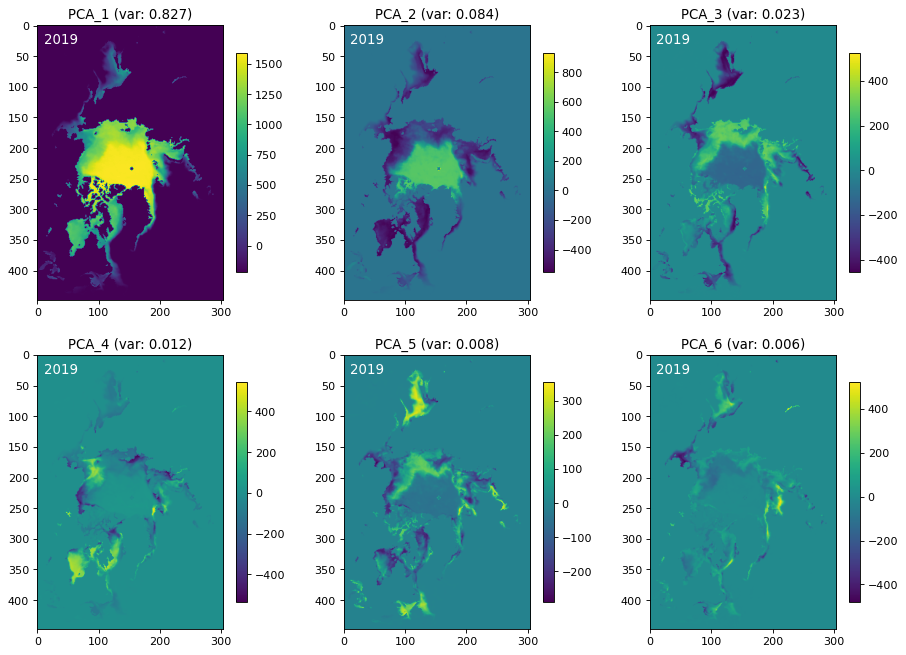

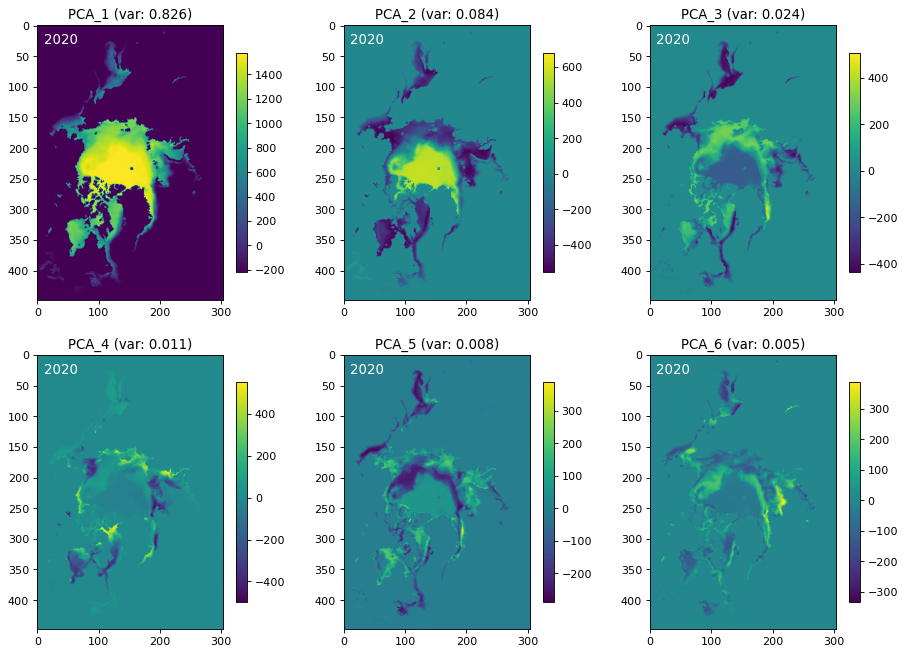

In [262]:
# PCA analysis for the one-year data (dimension for each year: 365) ----------------------------------------

df_sie = pd.read_csv("result\\SIE_NH.csv", index_col = 0)

for y in range(2013, 2021): #df_sie['year'].unique()[:]:
    idx = (df_sie['year'] == y)
    sic_part = sic_con[:, :, idx]
    
    # PCA analysis
    n = 10
    pca_in = reshape_pca(sic_part) # make input for PCA
    pca = PCA(n_components=n)
    pca_c0 = pca.fit_transform(pca_in) # PCA tranformation
    pca_c = decomposition_pca(pca_c0, n, lat) # convert 2D array into original 3D array again
    pca_var = pca.explained_variance_ratio_
    del pca_c0, pca_in
    
    imgname = "result\\4_PCA\\PCA_{0}.png".format(y)
    draw_pca(pca_c, pca_var, imgname)
    
    print(y)

## The END